# MiloDE on in vitro HE multiome

# To do:
- filter by CDR (not just minimum expression) <--- most important
- Use embryo as covariate instead of sample <--- 2nd most important
- Optimize Nhoods
- Downstream analysis (GO??)
- Set WGCNA filter for Nhoods genes are differential in to higher number (since more Nhoods present in the data)

In [1]:
suppressPackageStartupMessages({
    library(miloDE)
    library(scuttle)
    suppressMessages(library(miloR))
    suppressMessages(library(uwot))
    library(scran)
    suppressMessages(library(dplyr))
    library(reshape2)
    library(scWGCNA)
    suppressMessages(library(Seurat))
    library(ggplot2)
    library(viridis)
    library(ggpubr)
    library(BiocParallel)
    library(data.table)
})
ncores = 16
mcparam = MulticoreParam(workers = ncores)
register(mcparam)

In [2]:
main = "/rds/project/rds-SDzz0CATGms/users/bt392/01_Eomes_RNA/"
source(paste0(main, "mapping_functions.R"))
args = list() 
args$outdir = file.path(main, '11_miloDE/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)


Attaching package: ‘cowplot’


The following object is masked from ‘package:ggpubr’:

    get_legend


Warning message:
“The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


In [3]:

load_data(remove_doublets = TRUE, remove_stripped = TRUE)
mapping_dir = paste0(main, '07_atlas_mapping/')
meta = read.csv(paste0(mapping_dir, 'meta_complete.csv'))

colData(sce) <- meta %>% tibble::column_to_rownames("cell") %>% DataFrame

pca = read.csv(paste0(main, '06_batch_correct/PCA_corrected.csv'))

rownames(pca) = pca[,1]
pca = pca[,-1]

umap_mapped = colData(sce)[,c('umapX.mapped', 'umapY.mapped')]
reducedDims(sce) <- list(pca.corrected=pca, umap_mapped=umap_mapped)

reducedDim(sce, "pca.corrected") = as.matrix(reducedDim(sce, "pca.corrected"))

Loading required package: scater


Attaching package: ‘scater’


The following object is masked from ‘package:limma’:

    plotMDS




In [4]:
genenames = fread("/rds/project/rds-SDzz0CATGms/users/bt392/gene_names.csv") %>% 
            setnames(c('ensembl_gene_id','external_gene_name'), c('gene', 'gene_name'))
genenames = genenames[genenames$gene %in% rownames(sce)]
genenames = merge(genenames, as.data.frame(rownames(sce)), by.x='gene', by.y='rownames(sce)', all.y=TRUE)
genenames$gene_name[genenames$gene_name==''] = NA
genenames[is.na(genenames$gene_name),] = genenames$gene[is.na(genenames$gene_name)]
genenames = genenames[order(match(genenames$gene, rownames(sce)))]
rownames(sce) = genenames$gene_name

In [9]:
# Seurat for Luke
seurat = CreateSeuratObject(counts = sce@assays@data$counts)
seurat@assays$RNA@data = sce@assays@data$logcounts
seurat@meta.data = as.data.frame(colData(sce))

# save seurat
saveRDS(seurat, file.path(main, 'seurat.rds'))

In [5]:
EmbryoCelltypeColours = c(
"Epiblast" = "#635547",
  "Primitive_Streak" = "#DABE99",
  "Caudal_epiblast" = "#9e6762",
  "PGC" = "#FACB12",
  "Anterior_Primitive_Streak" = "#c19f70",
  "Notochord" = "#0F4A9C",
  "Def._endoderm" = "#F397C0",
  "Gut" = "#EF5A9D",
  "Nascent_mesoderm" = "#C594BF",
  "Mixed_mesoderm" = "#DFCDE4",
  "Intermediate_mesoderm" = "#139992",
  "Caudal_Mesoderm" = "#3F84AA",
  "Paraxial_mesoderm" = "#8DB5CE",
  "Somitic_mesoderm" = "#005579",
  "Pharyngeal_mesoderm" = "#C9EBFB",
  "Cardiomyocytes" = "#B51D8D",
  "Allantois" = "#532C8A",
  "ExE_mesoderm" = "#8870ad",
  "Mesenchyme" = "#cc7818",
  "Haematoendothelial_progenitors" = "#FBBE92",
  "Endothelium" = "#ff891c",
  "Blood_progenitors" = "#c9a997",
  "Blood_progenitors_1" = "#f9decf",
  "Blood_progenitors_2" = "#c9a997",
  "Erythroid" = "#EF4E22",
  "Erythroid1" = "#C72228",
  "Erythroid2" = "#f79083",
  "Erythroid3" = "#EF4E22",
  "NMP" = "#8EC792",
  "Neurectoderm" = "#65A83E",
  "Rostral_neurectoderm" = "#65A83E",
  "Caudal_neurectoderm" = "#354E23",
  "Neural_crest" = "#C3C388",
  "Forebrain_Midbrain_Hindbrain" = "#647a4f",
  "Spinal_cord" = "#CDE088",
  "Surface_ectoderm" = "#f7f79e",
  "Visceral_endoderm" = "#F6BFCB",
  "ExE_endoderm" = "#7F6874",
  "ExE_ectoderm" = "#989898",
  "Parietal_endoderm" = "#1A1A1A"
)


In [6]:
reducedDims(sce) <- list(pca.corrected=pca, umap=umap_mapped)

In [7]:
sce$celltype.mapped = gsub(' ', '_', gsub('-', '_', gsub('/', '_', sce$celltype.mapped)))

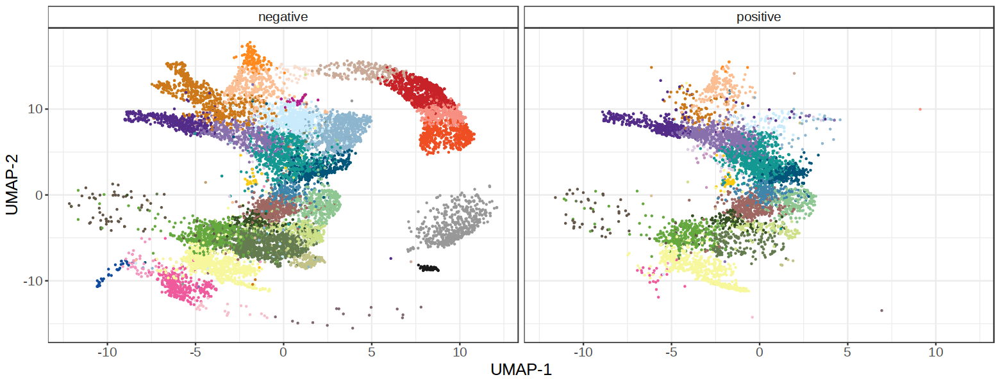

In [8]:
options(repr.plot.height=5, repr.plot.width=13)
# plot UMAPs, colored by cell types
umaps = cbind(as.data.frame(colData(sce)))

p = ggplot(umaps , aes(x = umapX.mapped, y = umapY.mapped , col = celltype.mapped)) +
  geom_point(size=0.2) + 
  scale_color_manual(values=EmbryoCelltypeColours, name='') +
  facet_wrap(~tdTom) +
  theme_bw() + 
  theme(legend.position='none',
       strip.background=element_rect(fill=NA),
       text=element_text(size=15)) + 
  labs(x = "UMAP-1", y = "UMAP-2")
p

Converting de_stat to 'data.frame' format

Warning message in plot_milo_by_single_metric(x, nhood_stat = nhood_stat, colour_by = "logFC", :
“Coercing layout to matrix format”


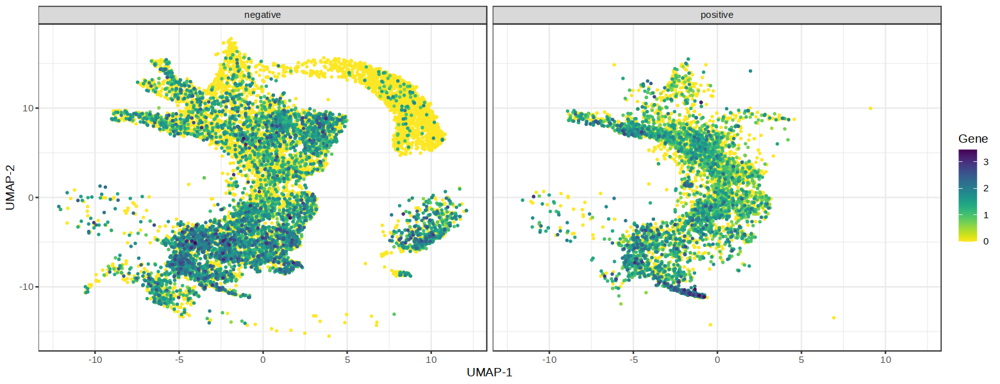

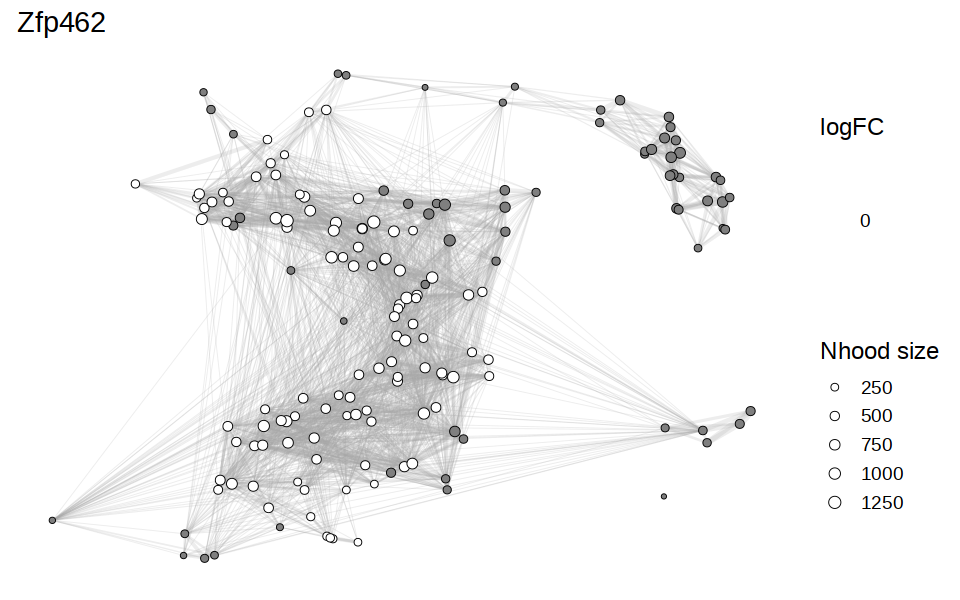

In [54]:
options(repr.plot.height=5, repr.plot.width=13)
# Examples of no CDR leading to bad results:
# 'Mesp1', 'Kdr' , 'Wnt3a'
gene = 'Zfp462'
test = cbind(umaps, data.table(gene=as.vector(logcounts(sce[gene,])))) %>% as.data.table() %>% 
    .[order(gene),]
p = ggplot(test , aes(x = umapX.mapped, y = umapY.mapped , col = gene)) +
  geom_point(size=0.5) + 
  scale_color_viridis(begin=1, end=0, name = 'Gene') +
  facet_wrap(~tdTom) +
  theme_bw() + 
  labs(x = "UMAP-1", y = "UMAP-2")
p


genes = gene

plots = lapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE) + 
    ggtitle(gene)
  return(p)
})
options(repr.plot.height=5, repr.plot.width=8)
p = ggarrange(plotlist = plots , ncol = 1, nrow = 1) 
p

In [11]:
sce = sce[!rownames(sce) %in% rownames(sce)[duplicated(rownames(sce))],]

In [12]:
sce

class: SingleCellExperiment 
dim: 29434 27776 
metadata(0):
assays(2): counts logcounts
rownames(29434): Xkr4 Gm1992 ... ENSMUSG00000095742 tomato-td
rowData names(0):
colnames(27776): cell_1 cell_2 ... cell_30169 cell_30171
colData names(21): barcode stage ... umapX.mapped umapY.mapped
reducedDimNames(2): pca.corrected umap
mainExpName: NULL
altExpNames(0):

Running for next k values:
10, 15, 20, 25, 30, 35, 40



100% covered by 395 sets.


Finished for k = 10



100% covered by 238 sets.


Finished for k = 15



100% covered by 171 sets.


Finished for k = 20



100% covered by 135 sets.


Finished for k = 25



100% covered by 114 sets.


Finished for k = 30



100% covered by 95 sets.


Finished for k = 35



100% covered by 82 sets.


Finished for k = 40

Finished the estimation of neighbourhood sizes ~ k dependancy (order = 2).



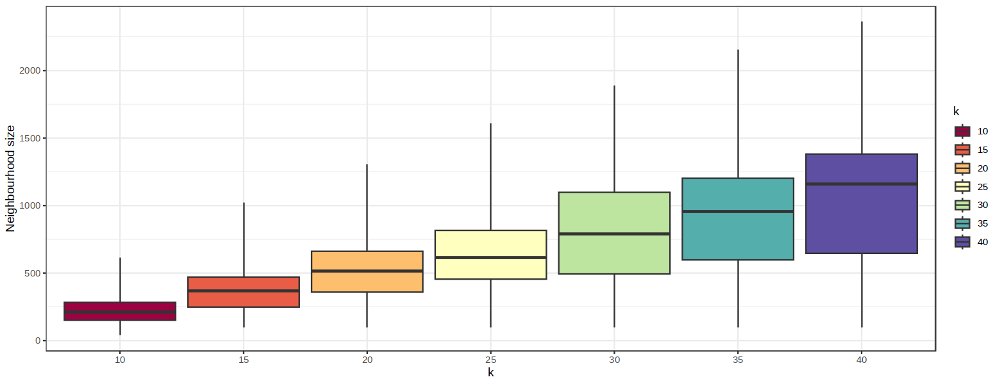

In [13]:
stat_k = estimate_neighbourhood_sizes(sce, k_grid = seq(10,40,5) , 
                                      order = 2, prop = 0.2 , filtering = TRUE,
                                      reducedDim_name = "pca.corrected" , plot_stat = TRUE)

In [14]:
knitr::kable(stat_k , caption = "Neighbourhood size distribution ~ k")



Table: Neighbourhood size distribution ~ k

|k  | min|    q25|    med|     q75|  max|
|:--|---:|------:|------:|-------:|----:|
|10 |  39| 150.50|  211.0|  282.50|  615|
|15 |  97| 248.25|  366.5|  470.25| 1022|
|20 |  99| 359.00|  515.0|  661.00| 1305|
|25 |  99| 455.00|  615.0|  816.00| 1610|
|30 |  99| 493.50|  792.0| 1097.75| 1892|
|35 |  99| 597.50|  954.0| 1202.00| 2153|
|40 |  99| 646.00| 1161.0| 1381.25| 2363|

In [15]:
set.seed(32)
# What does order mean here?
sce_milo = assign_neighbourhoods(sce , k = 20, prop = 0.2, order = 2, 
                                 filtering = TRUE , reducedDim_name = "pca.corrected" , verbose = F)
#> 100% covered by 42 sets.

100% covered by 168 sets.


Converting celltype.mapped to factor...

Warning message in plot_milo_by_single_metric(sce_milo, nhood_stat_ct, colour_by = "celltype.mapped", :
“Coercing layout to matrix format”
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


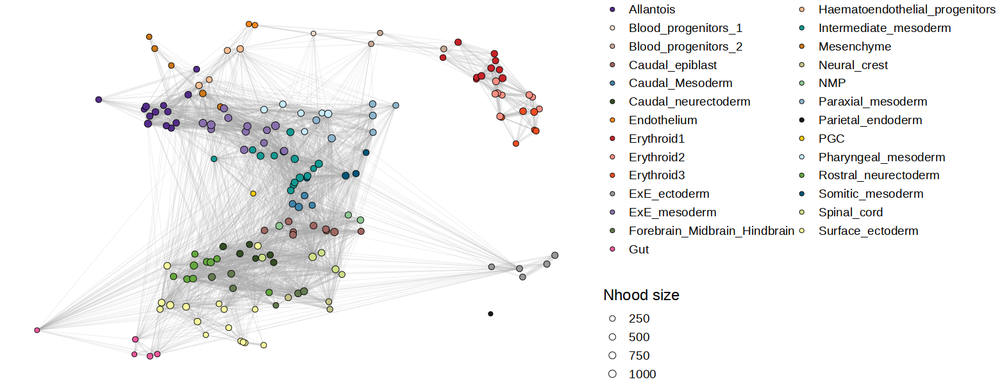

In [16]:
nhoods_sce = nhoods(sce_milo)
# assign cell types for nhoods 
nhood_stat_ct = data.frame(Nhood = 1:ncol(nhoods_sce) , Nhood_center = colnames(nhoods_sce))
nhood_stat_ct = miloR::annotateNhoods(sce_milo , nhood_stat_ct , coldata_col = "celltype.mapped")
#> Converting seurat_clusters to factor...
p = plot_milo_by_single_metric(sce_milo, nhood_stat_ct, colour_by = "celltype.mapped" , 
                                      layout = "umap" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_manual(values = EmbryoCelltypeColours , name = "celltype.mapped")
p

Converting celltype.mapped to factor...

Warning message in plot_milo_by_single_metric(sce_milo, nhood_stat_ct, colour_by = "celltype.mapped", :
“Coercing layout to matrix format”
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


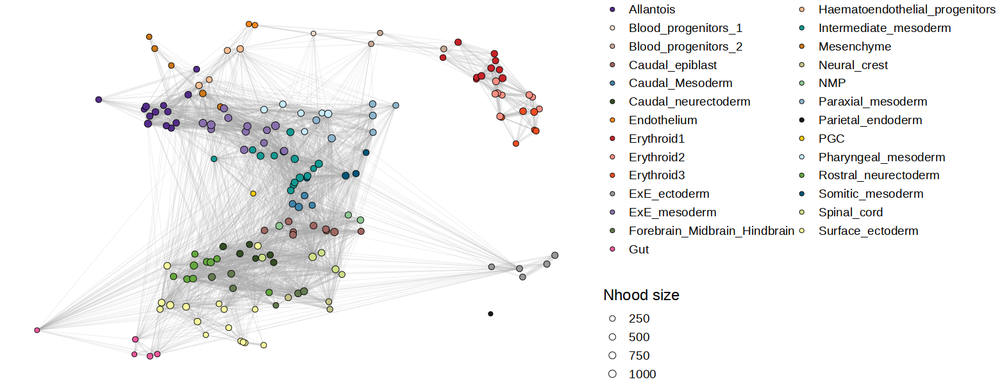

In [17]:
nhoods_sce = nhoods(sce_milo)
# assign cell types for nhoods 
nhood_stat_ct = data.frame(Nhood = 1:ncol(nhoods_sce) , Nhood_center = colnames(nhoods_sce))
nhood_stat_ct = miloR::annotateNhoods(sce_milo , nhood_stat_ct , coldata_col = "celltype.mapped")
#> Converting seurat_clusters to factor...
p = plot_milo_by_single_metric(sce_milo, nhood_stat_ct, colour_by = "celltype.mapped" , 
                                      layout = "umap" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_manual(values = EmbryoCelltypeColours , name = "celltype.mapped")
p

In [18]:
unique(sce_milo$sample)

[1] 3 8 4 5 1 6 2 7

In [19]:
ncores = 16
mcparam = MulticoreParam(workers = ncores)
register(mcparam)

In [20]:
stat_auc = suppressWarnings(calc_AUC_per_neighbourhood(sce_milo , sample_id = "sample" , condition_id = "tdTom", min_n_cells_per_sample = 20, BPPARAM = mcparam))

p = plot_milo_by_single_metric(sce_milo, stat_auc, colour_by = "auc" , 
                                      layout = "umap" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_viridis(name = "AUC")

Warning message in plot_milo_by_single_metric(sce_milo, stat_auc, colour_by = "auc", :
“Coercing layout to matrix format”
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


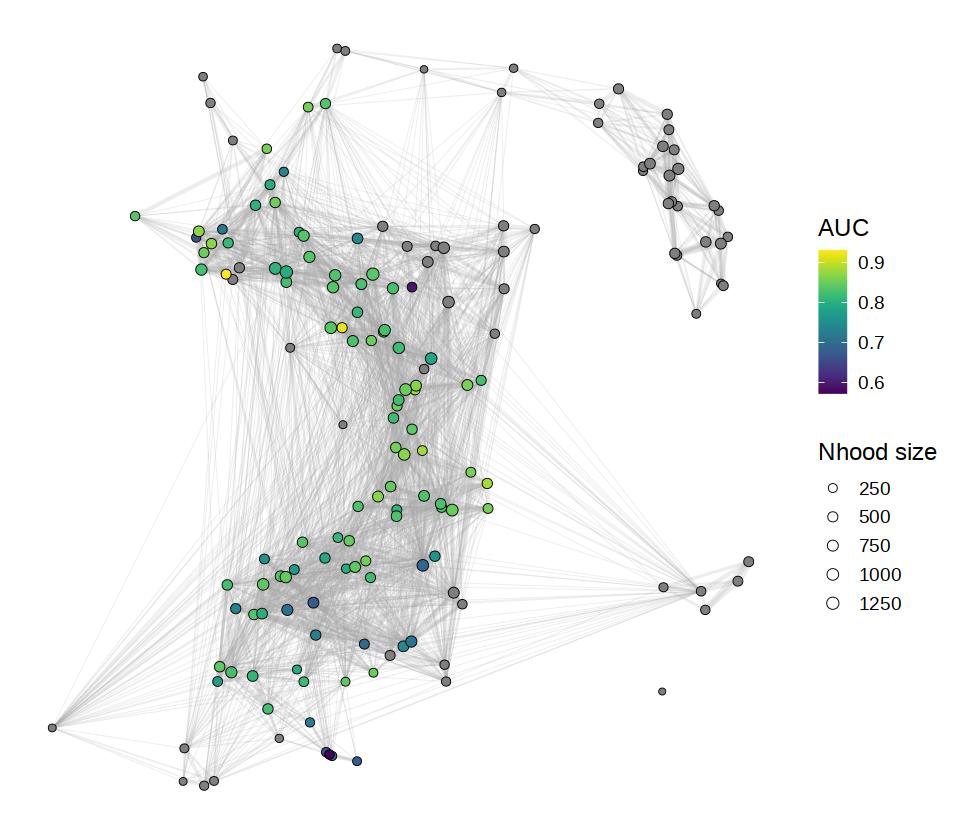

In [21]:
options(repr.plot.height=7, repr.plot.width=8)
p

DE testing is done.
102 neighbourhoods (out of 102) were tested.

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


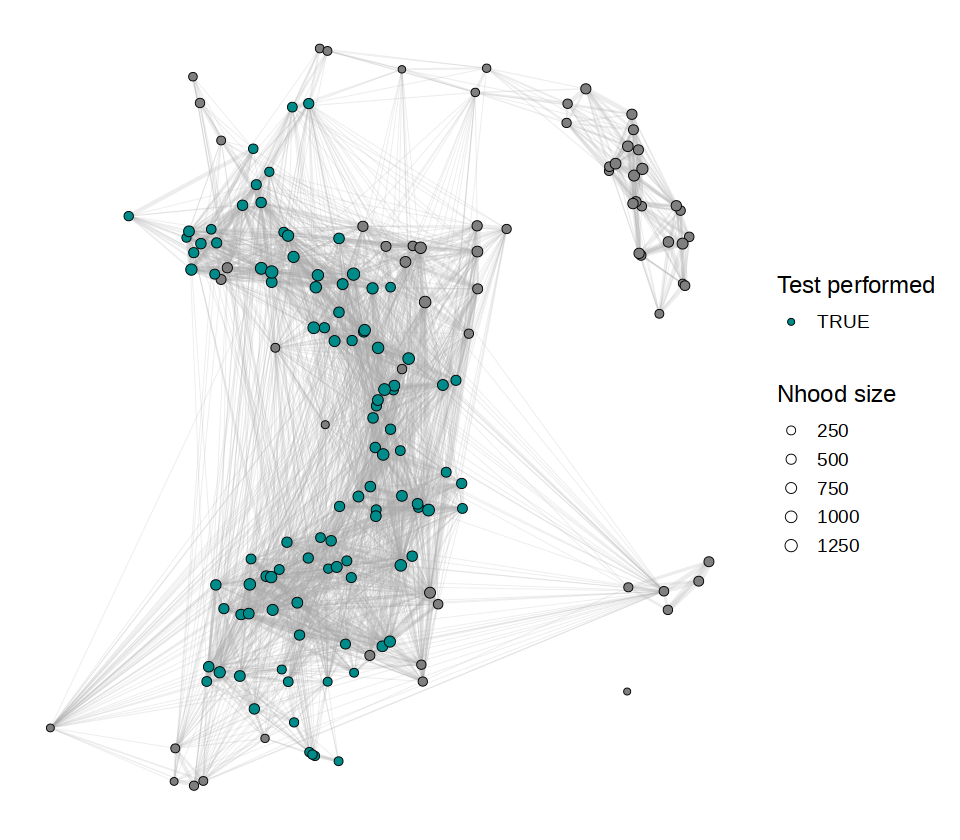

In [25]:
de_stat = de_test_neighbourhoods(sce_milo ,
                             sample_id = "sample",
                             design = ~tdTom,
                             covariates = c("tdTom"), # why covariate same as design?
                             min_count = 25,
                             subset_nhoods = stat_auc$Nhood[!is.na(stat_auc$auc)],
                             output_type = "SCE",
                             plot_summary_stat = TRUE,
                             layout = "umap", BPPARAM = mcparam , 
                             verbose = F)

In [26]:
# de_stat = de_test_neighbourhoods(sce_milo ,
#                              sample_id = "sample",
#                              design = ~pool+tdTom, # -> see if this is the right way to do it
#                              covariates = c("pool", tdTom"), # why covariate same as design?
#                              subset_nhoods = stat_auc$Nhood[!is.na(stat_auc$auc)],
#                              output_type = "SCE",
#                              plot_summary_stat = TRUE,
#                              layout = "umap", BPPARAM = mcparam , 
#                              verbose = F)

In [27]:
head(de_stat)

class: SingleCellExperiment 
dim: 6 102 
metadata(0):
assays(4): logFC pval pval_corrected_across_genes
  pval_corrected_across_nhoods
rownames(6): Sox17 Mrpl15 ... Atp6v1h Rb1cc1
rowData names(0):
colnames(102): 5 6 ... 167 168
colData names(3): Nhood Nhood_center test_performed
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [88]:
saveRDS(de_stat, sprintf('%s/de_stat.rds', args$outdir))
saveRDS(sce_milo, sprintf('%s/sce_milo.rds', args$outdir))

Warning message in plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by = "n_DE_genes", :
“Coercing layout to matrix format”
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Warning message in plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by = "n_specific_DE_genes", :
“Coercing layout to matrix format”
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


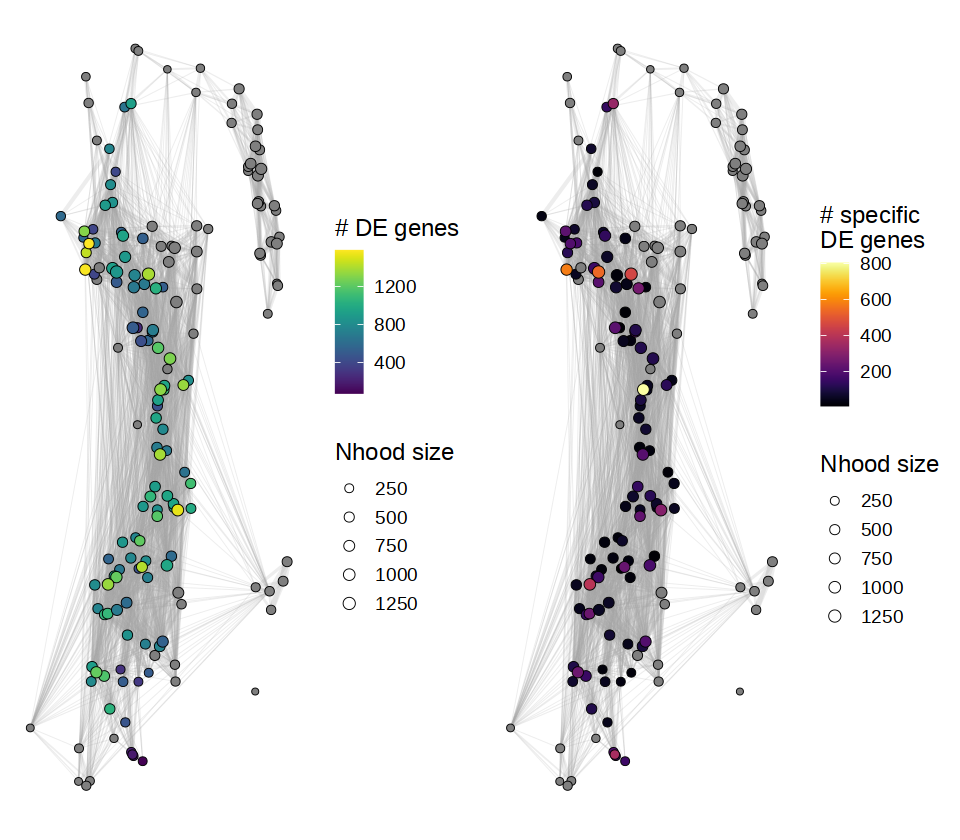

In [28]:
stat_de_magnitude = rank_neighbourhoods_by_DE_magnitude(de_stat)

p1 = plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by = "n_DE_genes" , 
                                      layout = "umap" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_viridis(name = "# DE genes")
#> Warning in plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by =
#> "n_DE_genes", : Coercing layout to matrix format
#> Scale for 'fill' is already present. Adding another scale for 'fill', which
#> will replace the existing scale.
p2 = plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by = "n_specific_DE_genes" , 
                                      layout = "umap" , size_range = c(1.5,3) , edge_width = c(0.2,0.5)) + 
  scale_fill_viridis(name = "# specific\nDE genes" , option = "inferno")
#> Warning in plot_milo_by_single_metric(sce_milo, stat_de_magnitude, colour_by =
#> "n_specific_DE_genes", : Coercing layout to matrix format
#> Scale for 'fill' is already present. Adding another scale for 'fill', which
#> will replace the existing scale.
p = ggarrange(p1,p2)
p

Converting de_stat to 'data.frame' format

Warning message in plot_milo_by_single_metric(x, nhood_stat = nhood_stat, colour_by = "logFC", :
“Coercing layout to matrix format”
Converting de_stat to 'data.frame' format

Warning message in plot_milo_by_single_metric(x, nhood_stat = nhood_stat, colour_by = "logFC", :
“Coercing layout to matrix format”
Converting de_stat to 'data.frame' format

Warning message in plot_milo_by_single_metric(x, nhood_stat = nhood_stat, colour_by = "logFC", :
“Coercing layout to matrix format”


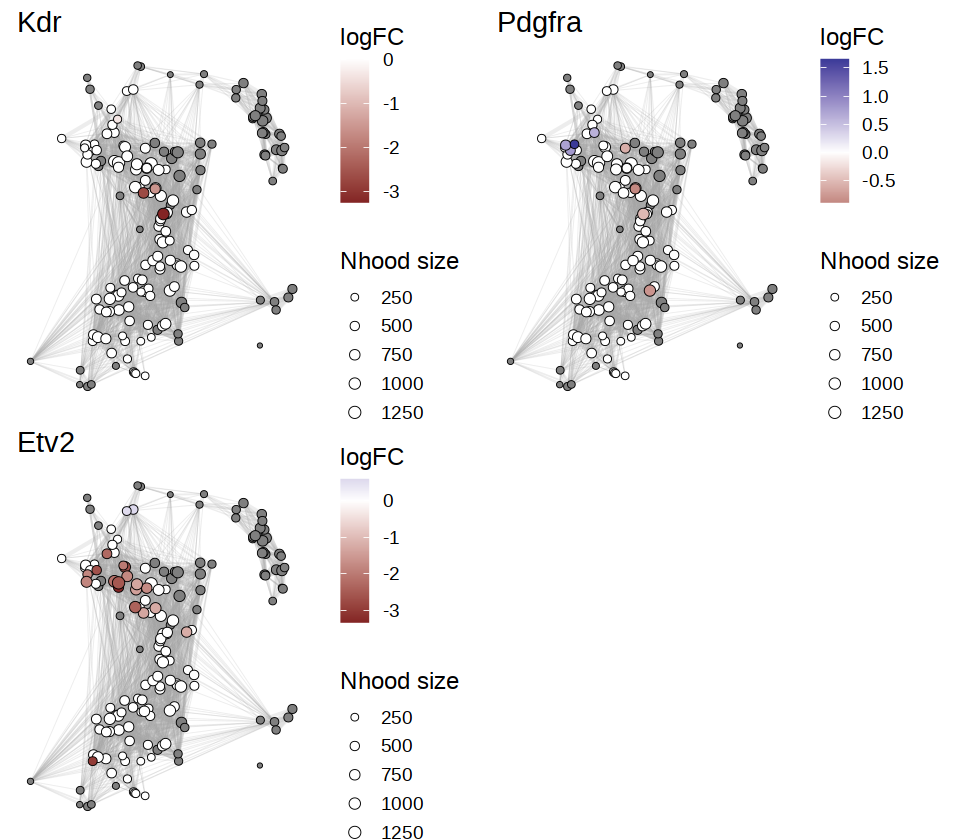

In [30]:
genes = c('Kdr','Pdgfra', 'Etv2')
plots = lapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE) + 
    ggtitle(gene)
  return(p)
})

p = ggarrange(plotlist = plots, ncol=2, nrow=2)
p

Converting de_stat to 'data.frame' format

Warning message in plot_milo_by_single_metric(x, nhood_stat = nhood_stat, colour_by = "logFC", :
“Coercing layout to matrix format”
Converting de_stat to 'data.frame' format

Warning message in plot_milo_by_single_metric(x, nhood_stat = nhood_stat, colour_by = "logFC", :
“Coercing layout to matrix format”
Converting de_stat to 'data.frame' format

Warning message in plot_milo_by_single_metric(x, nhood_stat = nhood_stat, colour_by = "logFC", :
“Coercing layout to matrix format”
Converting de_stat to 'data.frame' format

Warning message in plot_milo_by_single_metric(x, nhood_stat = nhood_stat, colour_by = "logFC", :
“Coercing layout to matrix format”


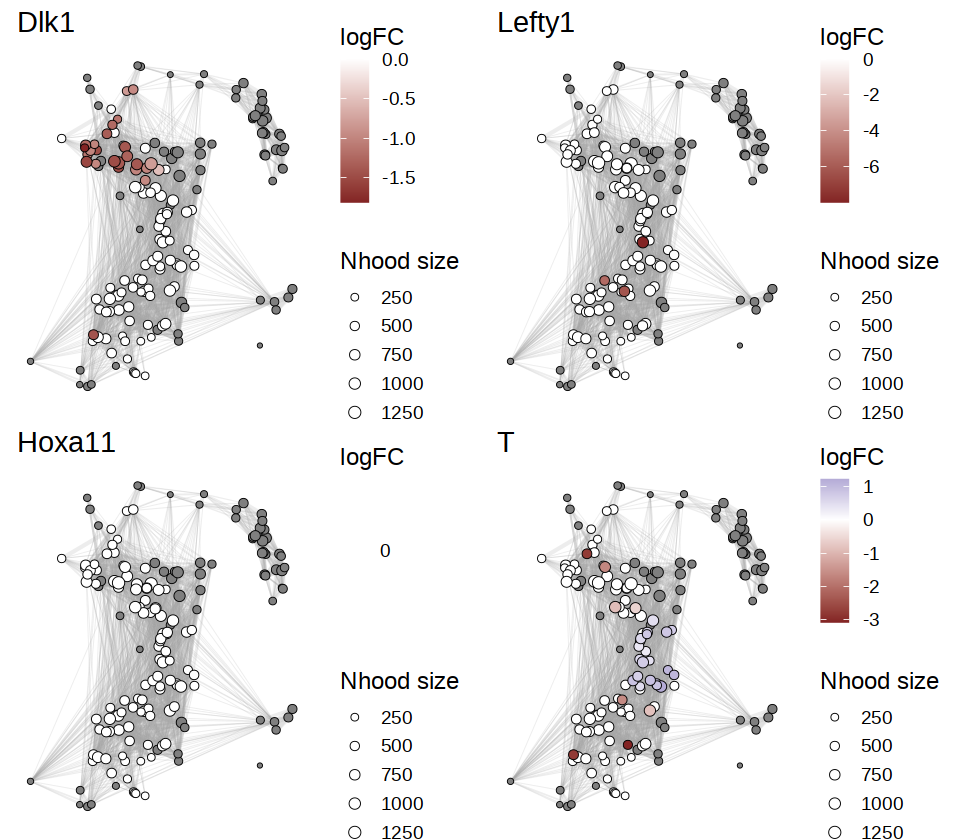

In [31]:
genes = c('Dlk1','Lefty1', 'Hoxa11', 'T')
plots = lapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE) + 
    ggtitle(gene)
  return(p)
})

p = ggarrange(plotlist = plots, ncol=2, nrow=2)
p

In [32]:
get_wgcna_modules = function(de_stat , subset_hoods = NULL , 
                             n_hoods_sig.thresh = 2 ,
                             npcs = 5 ,
                             pval.thresh = 0.1 ){
  require(scWGCNA)
  require(Seurat)
  require(dplyr)
  require(reshape2)
  
  set.seed(32)
  # subset hoods
  if (!is.null(subset_hoods)){
    de_stat = de_stat[de_stat$Nhood %in% subset_hoods , ]
  }
  
  # focus on genes that DE in at least 2 nhoods
  de_stat_per_gene = as.data.frame(de_stat %>% group_by(gene) %>% dplyr::summarise(n_hoods_sig = sum(pval_corrected_across_nhoods < pval.thresh , na.rm = TRUE)))
  genes_sig = de_stat_per_gene$gene[de_stat_per_gene$n_hoods_sig >= n_hoods_sig.thresh]
  
  de_stat = de_stat[de_stat$gene %in% genes_sig, ]
  de_stat = de_stat[order(de_stat$Nhood) , ]
  
  # discard neighbourhoods in which testing was not performed
  de_stat = de_stat[de_stat$test_performed , ]
  
  # for this analysis, set logFC to 0 and pvals to 1 if they are NaN
  de_stat$logFC[is.na(de_stat$logFC)] = 0
  de_stat$pval[is.na(de_stat$pval)] = 1
  de_stat$pval_corrected_across_genes[is.na(de_stat$pval_corrected_across_genes)] = 1
  de_stat$pval_corrected_across_nhoods[is.na(de_stat$pval_corrected_across_nhoods)] = 1
  
  # set logFC to 0 if pval_corrected_across_nhoods > pval.thresh
  de_stat$logFC[de_stat$pval_corrected_across_nhoods >= pval.thresh] = 0
  
  # move the object to Seurat
  de_stat = reshape2::dcast(data = de_stat, formula = gene~Nhood, value.var = "logFC")
  rownames(de_stat) = de_stat$gene
  de_stat = de_stat[,2:ncol(de_stat)]
  
  obj.seurat <- CreateSeuratObject(counts = de_stat)
  DefaultAssay(obj.seurat) <- "RNA"
  obj.seurat = FindVariableFeatures(obj.seurat)
  # scale
  obj.seurat[["RNA"]]@scale.data = as.matrix(obj.seurat[["RNA"]]@data)
  obj.seurat = RunPCA(obj.seurat , npcs = npcs)
  
  # run scwgcna
  clusters_scwgcna = run.scWGCNA(p.cells = obj.seurat, 
                                 s.cells = obj.seurat, 
                                 is.pseudocell = F, 
                                 features = rownames(obj.seurat),
                                 less = TRUE , merging = TRUE)
  # compile stat
  clusters = lapply(1:length(clusters_scwgcna$module.genes) , function(i){
    out = data.frame(cluster = i , gene = clusters_scwgcna$module.genes[[i]] , n_genes = length(clusters_scwgcna$module.genes[[i]]))
    return(out)
  })
  clusters = do.call(rbind , clusters)
  # add colors
  genes_w_colors = clusters_scwgcna$dynamicCols
  genes_w_colors = data.frame(gene = names(genes_w_colors) , cluster_color = genes_w_colors)
  clusters = merge(clusters , genes_w_colors)
  
  return(clusters)
}


Warning message in eval(predvars, data, env):
“NaNs produced”
Warning message in hvf.info$variance.expected[not.const] <- 10^fit$fitted:
“number of items to replace is not a multiple of replacement length”


[1] "We have 2601 genes in the variable genes object"


Warning message:
“executing %dopar% sequentially: no parallel backend registered”
Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”
Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'y'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


   Power SFT.R.sq  slope truncated.R.sq  mean.k. median.k.  max.k.
1      1   0.0193 -16.50          0.985 1.30e+03  1.30e+03 1330.00
2      2   0.5320 -28.80          0.849 6.70e+02  6.68e+02  733.00
3      3   0.7420 -16.30          0.873 3.53e+02  3.50e+02  433.00
4      4   0.8490 -10.80          0.930 1.91e+02  1.87e+02  272.00
5      5   0.8960  -7.98          0.962 1.05e+02  1.02e+02  180.00
6      6   0.9220  -6.32          0.975 5.96e+01  5.63e+01  125.00
7      7   0.9250  -5.34          0.982 3.45e+01  3.18e+01   90.10
8      8   0.9400  -4.53          0.991 2.05e+01  1.83e+01   67.10
9      9   0.9520  -3.94          0.994 1.25e+01  1.07e+01   51.40
10    10   0.9570  -3.51          0.994 7.78e+00  6.35e+00   40.30
11    12   0.9280  -3.02          0.964 3.27e+00  2.36e+00   26.20
12    14   0.4100  -3.92          0.356 1.52e+00  9.34e-01   18.00
13    16   0.4030  -3.44          0.362 7.79e-01  3.92e-01   12.90
14    18   0.3990  -3.09          0.366 4.37e-01  1.72e-01    

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9789  .... my.Clsize:  15"
23 genes not assigned to any module.
576 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9785  .... my.Clsize:  15"
28 genes not assigned to any module.
243 genes excluded due to significance.

IMPORTANT NOTE!!!
You have run this analysis witht the option less=TRUE. If a module seems to be highly expressed in only 1-3 cells ( cells expressing >2*(max(expression)/3) ), it will be removed.


Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”



Info: Some clusters will be merged
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 34 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 26 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 26 module eigengenes in given set.
The following modules were only highly expressed in less than 3 cells :  violet
They will all be removed

This is the result of the filtering.
The color of the modules does not correspond between original and filtered
TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.


Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.979  .... my.Clsize:  20"


IMPORTANT NOTE!!!
You have run this analysis witht the option merging=TRUE. This means that based on their expression pattern, modules with similar expression profile (distance < 0.25) be merged during the iterations.
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 28 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 22 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 22 module eigengenes in given set.
0 genes not assigned to any module.
135 genes ex

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9795  .... my.Clsize:  22"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 26 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 21 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 20 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 20 module eigengenes in given set.
32 genes not assigned to any module.
121 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9799  .... my.Clsize:  15"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 25 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 18 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
0 genes not assigned to any module.
54 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9801  .... my.Clsize:  14"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 28 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 18 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
45 genes not assigned to any module.
53 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9809  .... my.Clsize:  17"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 25 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 16 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 16 module eigengenes in given set.
0 genes not assigned to any module.
47 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.981  .... my.Clsize:  14"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 27 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 16 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 16 module eigengenes in given set.
21 genes not assigned to any module.
13 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9813  .... my.Clsize:  14"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 26 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 15 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 15 module eigengenes in given set.
0 genes not assigned to any module.
15 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9815  .... my.Clsize:  9"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 30 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 16 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 16 module eigengenes in given set.
0 genes not assigned to any module.
14 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9815  .... my.Clsize:  9"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 30 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 20 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 18 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 18 module eigengenes in given set.
0 genes not assigned to any module.
9 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9816  .... my.Clsize:  13"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 26 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 15 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
0 genes not assigned to any module.
34 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9816  .... my.Clsize:  11"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 28 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 17 module eigengenes in given set.
0 genes not assigned to any module.
10 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9817  .... my.Clsize:  26"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 11 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 10 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 9 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 9 module eigengenes in given set.
0 genes not assigned to any module.
45 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.982  .... my.Clsize:  9"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 28 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
0 genes not assigned to any module.
13 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9822  .... my.Clsize:  9"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 25 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 15 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
0 genes not assigned to any module.
5 genes excluded due to significance.

Warning message in (function (x, y = NULL, robustX = TRUE, robustY = TRUE, use = "all.obs", :
“bicor: zero MAD in variable 'x'. Pearson correlation was used for individual columns with zero (or missing) MAD.”


TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
[1] "my.height:  0.9822  .... my.Clsize:  11"
 mergeCloseModules: Merging modules whose distance is less than 0.25
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 25 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 14 module eigengenes in given set.
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 13 module eigengenes in given set.
   Calculating new MEs...
   multiSetMEs: Calculating module MEs.
     Working on set 1 ...
     moduleEigengenes: Calculating 13 module eigengenes in given set.
0 genes not assigned to any module.
0 genes excluded due to significance.

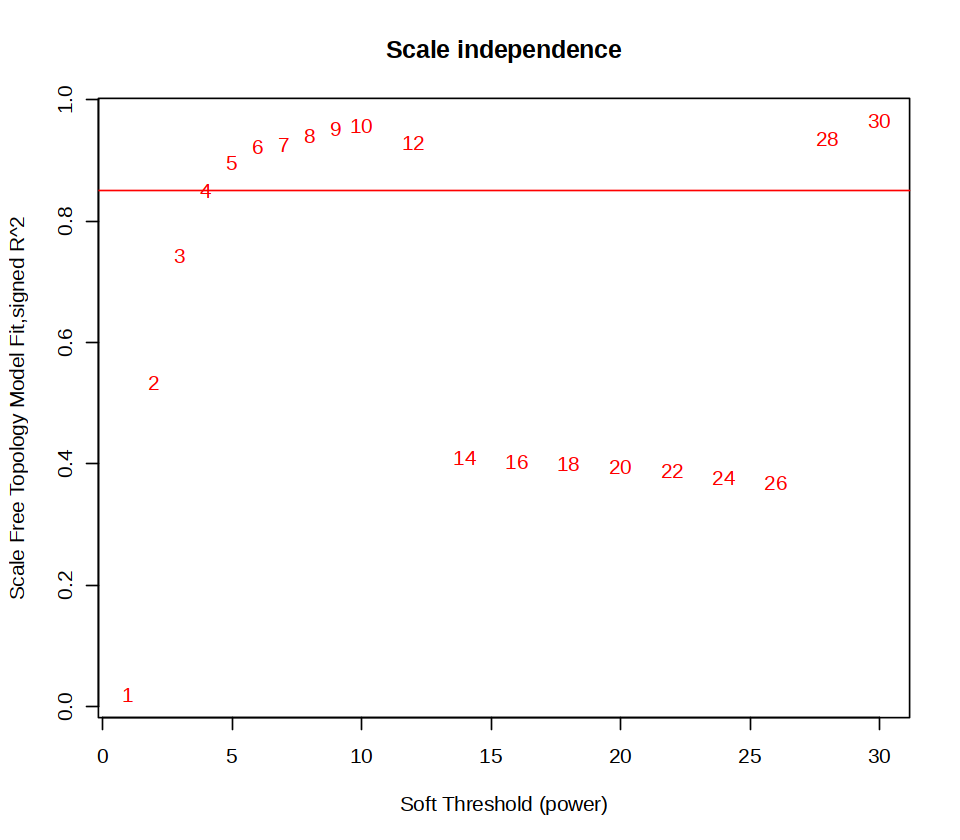

In [33]:
# for this vignette, for simplicity we will focus on genes that are DE in at least 4 neighbourhoods
modules_wgcna = suppressMessages(get_wgcna_modules(convert_de_stat(de_stat) , n_hoods_sig.thresh = 4))

In [ ]:
fwrite(modules_wgcna, sprintf('%s/modules_wgcna.txt.gz', args$outdir))

In [44]:
plots = lapply(sort(unique(modules_wgcna$cluster)) , function(cluster){
  p = plot_DE_gene_set(sce_milo, de_stat , genes = modules_wgcna$gene[modules_wgcna$cluster == cluster],
                            layout = "umap" , size_range = c(0.5,3) ,
                            node_stroke = 0.3, edge_width = c(0.2,0.5)) +
    ggtitle(paste0("Module ", cluster, ", ", length(modules_wgcna$gene[modules_wgcna$cluster == cluster]) , " genes"))
  return(p)
})

Warning message in plot_milo_by_single_metric(x, nhood_stat, colour_by = "avg_logFC", :
“Coercing layout to matrix format”
Warning message in plot_milo_by_single_metric(x, nhood_stat, colour_by = "avg_logFC", :
“Coercing layout to matrix format”
Warning message in plot_milo_by_single_metric(x, nhood_stat, colour_by = "avg_logFC", :
“Coercing layout to matrix format”
Warning message in plot_milo_by_single_metric(x, nhood_stat, colour_by = "avg_logFC", :
“Coercing layout to matrix format”
Warning message in plot_milo_by_single_metric(x, nhood_stat, colour_by = "avg_logFC", :
“Coercing layout to matrix format”
Warning message in plot_milo_by_single_metric(x, nhood_stat, colour_by = "avg_logFC", :
“Coercing layout to matrix format”
Warning message in plot_milo_by_single_metric(x, nhood_stat, colour_by = "avg_logFC", :
“Coercing layout to matrix format”
Warning message in plot_milo_by_single_metric(x, nhood_stat, colour_by = "avg_logFC", :
“Coercing layout to matrix format”
Warning message 

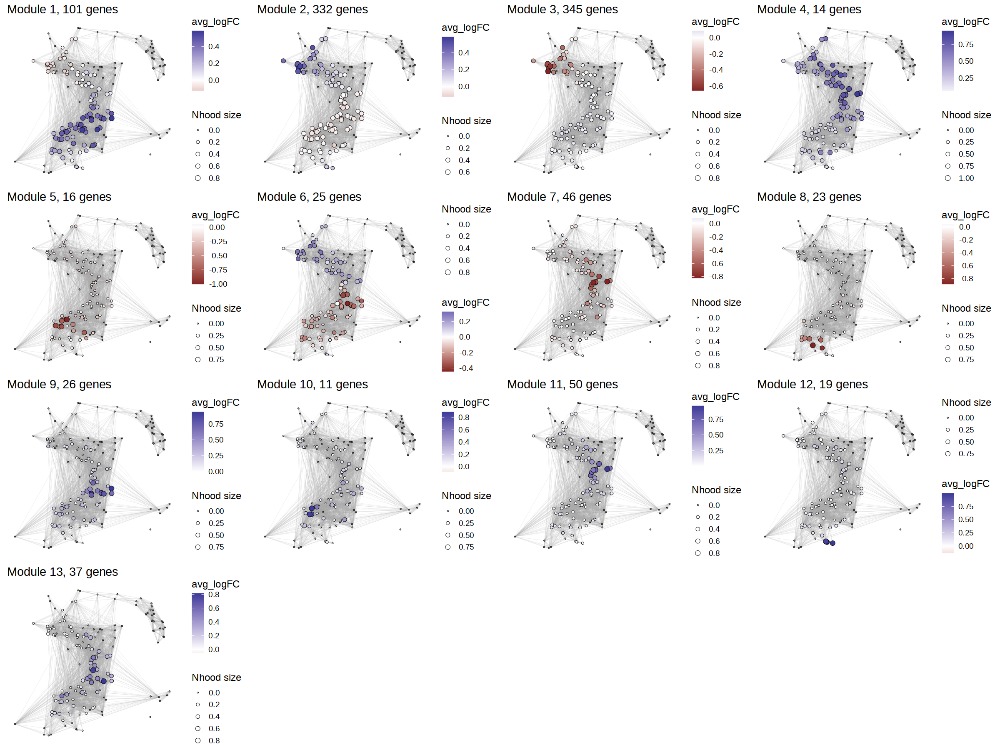

In [45]:
options(repr.plot.height=15, repr.plot.width=20)
p = ggarrange(plotlist = plots)
p

Converting de_stat to 'data.frame' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format

Converting de_stat to 'SingleCellExperiment' format



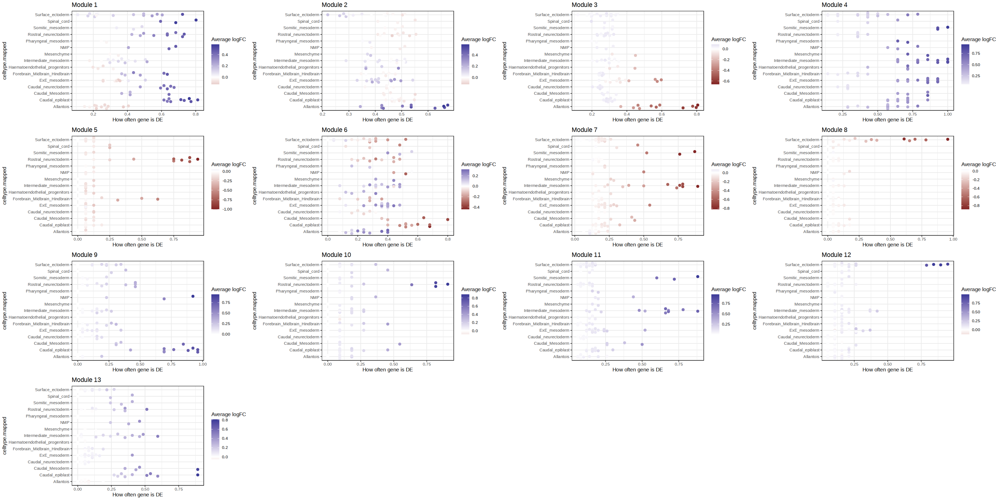

In [46]:
# we first need to assign cell type label to each neighbourhood - we have calculated it previously
# we will use data.frame format for de-stat; the conversion between SingleCellExperiment and data.frame formats can be done using `convert_de_stat`
de_stat_df = convert_de_stat(de_stat)
#> Converting de_stat to 'data.frame' format
de_stat_df = merge(de_stat_df , nhood_stat_ct , by = c("Nhood" , "Nhood_center"))


plots = lapply(sort(unique(modules_wgcna$cluster)) , function(cluster){
  p = plot_beeswarm_gene_set(de_stat_df, 
                             genes = modules_wgcna$gene[modules_wgcna$cluster == cluster], 
                             nhoodGroup = "celltype.mapped") + 
    ggtitle(paste0("Module ", cluster))
  return(p)
})
p = ggarrange(plotlist = plots)
options(repr.plot.height=15, repr.plot.width=30)
p

[1] "Actg1"   "Anxa6"   "Bsg"     "Cox6b1"  "Dusp22"  "Elp5"    "Igsf3"  
 [8] "Jup"     "Lamp2"   "Ndel1"   "Ndufa5"  "Ndufaf6" "Pacsin3" "Plet1"  
[15] "Qars"    "Tac2"    "Tcn2"    "Tmem98"  "Tns3"

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format



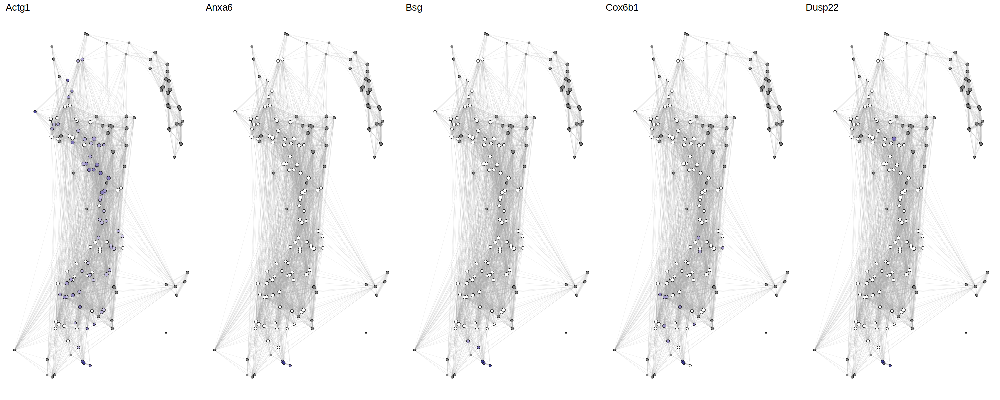

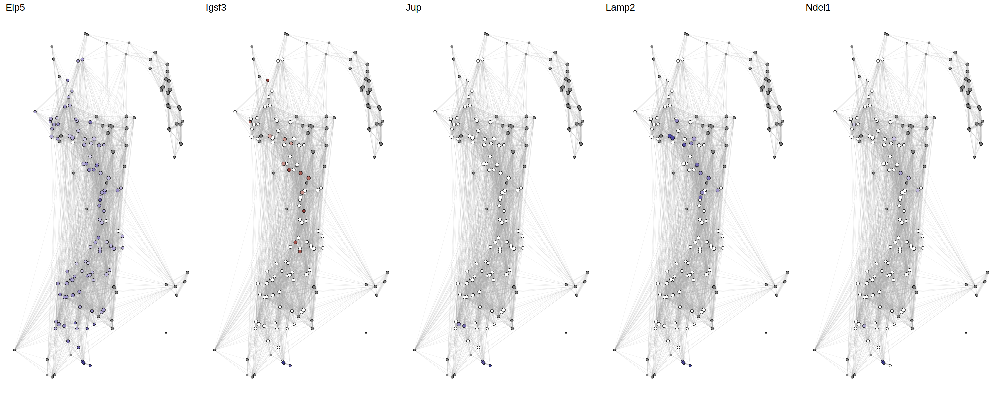

$`1`

$`2`

$`3`

$`4`

attr(,"class")
[1] "list"      "ggarrange"

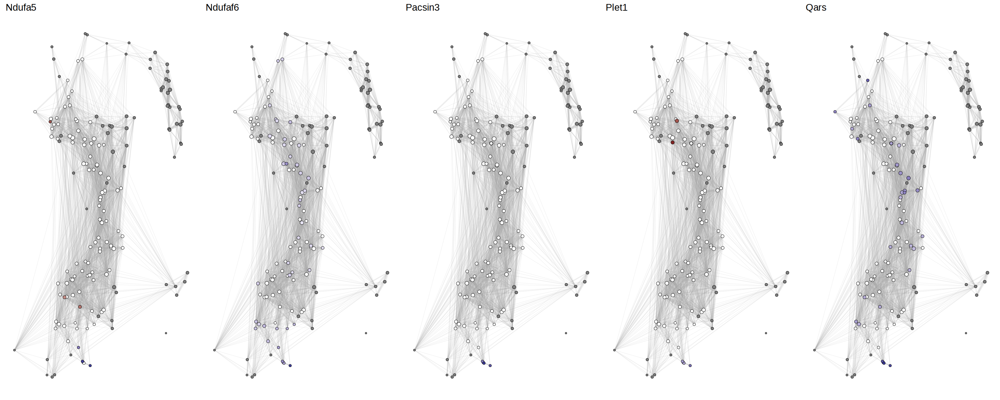

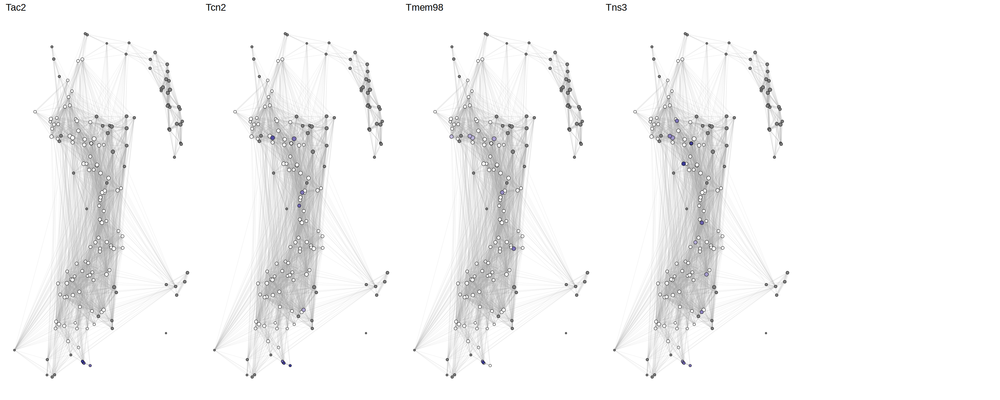

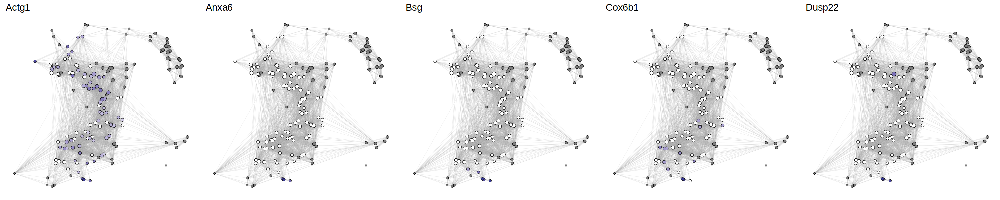

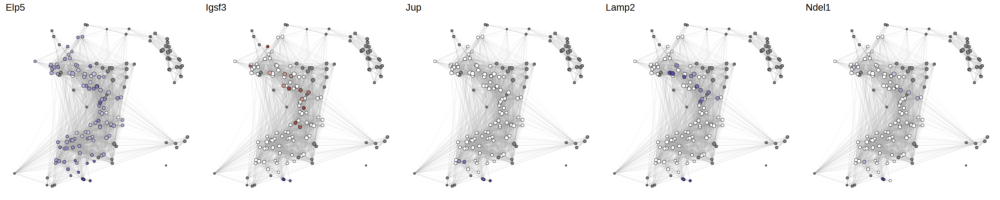

$`1`

$`2`

$`3`

$`4`

attr(,"class")
[1] "list"      "ggarrange"

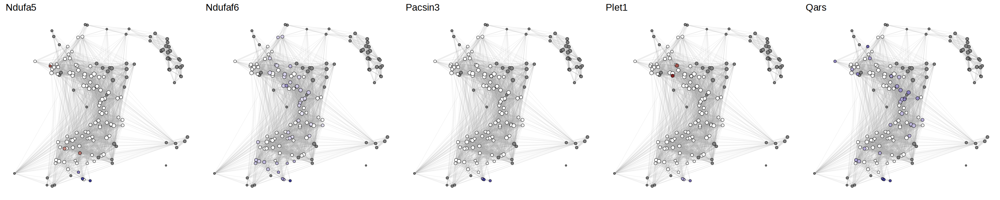

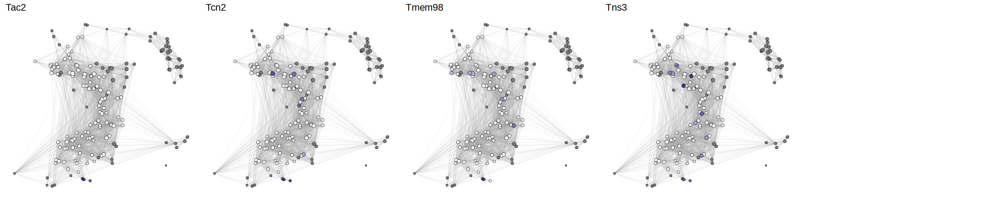

In [52]:
genes = modules_wgcna[modules_wgcna$cluster == 12,]$gene

plots = lapply(genes , function(gene){
  p = suppressWarnings(plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE)) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
})

options(repr.plot.height=5, repr.plot.width=25)
p = ggarrange(plotlist = plots , ncol = 5) 
p

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format

Converting de_stat to 'data.frame' format



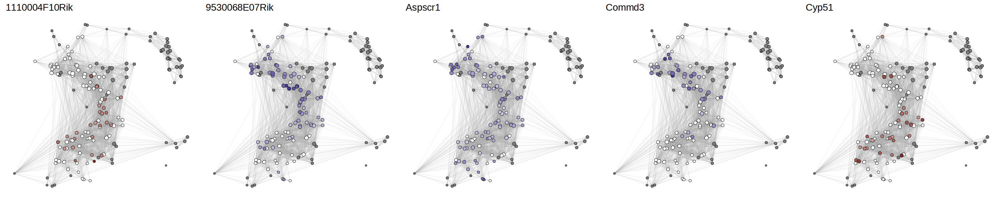

$`1`

$`2`

$`3`

attr(,"class")
[1] "list"      "ggarrange"

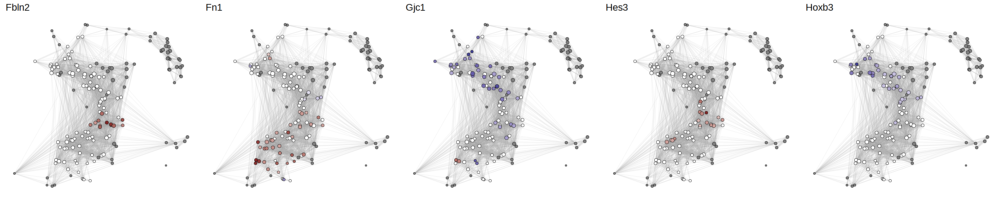

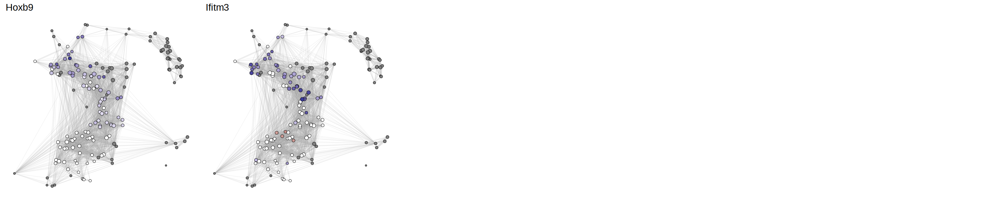

In [53]:
genes = head(modules_wgcna[modules_wgcna$cluster == 6,]$gene, 12)

plots = lapply(genes , function(gene){
  p = suppressWarnings(plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE)) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
})

options(repr.plot.height=5, repr.plot.width=25)
p = ggarrange(plotlist = plots , ncol = 5) 
p

In [ ]:
genes = c('Cd59a', 'Dlk1', 'Gli1', 'Sox2', 'Wnt4')

plots = lapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
})
options(repr.plot.height=10, repr.plot.width=8)
p = ggarrange(plotlist = plots , ncol = 2, nrow = 3) 
p

In [ ]:
modules_wgcna[modules_wgcna$cluster == 9,]$gene

In [ ]:
genes = c('Gata3', 'Jund', 'Hoxb3', 'Tbx2', 'Bambi')

plots = lapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
})
options(repr.plot.height=10, repr.plot.width=8)
p = ggarrange(plotlist = plots , ncol = 2, nrow = 3) 
p

In [ ]:
modules_wgcna[modules_wgcna$cluster == 3,]$gene

In [ ]:
genes = c('Cyp26a1', 'Nkx2-3', 'Npl', 'Itga6', 'Fzd2')

plots = lapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
})
options(repr.plot.height=10, repr.plot.width=8)
p = ggarrange(plotlist = plots , ncol = 2, nrow = 3) 
p

In [ ]:
genes = c('Meis2', 'Meis1', 'Foxa2', 'Sox17')

plots = lapply(genes , function(gene){
  p = plot_DE_single_gene(sce_milo, de_stat , gene = gene , layout = "umap" , set_na_to_0 = TRUE) + 
    ggtitle(gene) + theme(legend.position='none')
  return(p)
})
options(repr.plot.height=10, repr.plot.width=8)
p = ggarrange(plotlist = plots , ncol = 2, nrow = 2) 
p

In [ ]:
modules_wgcna[modules_wgcna$cluster == 8,]$gene

modules_wgcna[modules_wgcna$cluster == 12,]$gene

In [ ]:
### Export modules for metascape

# Get gene lists
gene_lists = lapply(unique(modules_wgcna$cluster), function(x){
    genes = modules_wgcna[modules_wgcna$cluster == x]$gene
})

# Get max length 
max = max(length(gene_lists))
x = c(x, rep(NA, max.len - length(x)))



In [ ]:
head(modules_wgcna)

In [ ]:
# Get gene lists
gene_lists = lapply(unique(modules_wgcna$cluster), function(x){
    genes = as.data.table(modules_wgcna)[cluster == x]$gene
    return(genes)
})

In [ ]:
max_length = max(sapply(gene_lists, length))

In [81]:
# Get gene lists
DEGs.dt = lapply(unique(modules_wgcna$cluster), function(x){
    genes = as.data.table(modules_wgcna)[cluster == x]$gene
    tmp = data.table('x' = c(genes, rep(NA, max_length - length(genes)))) %>% setnames(paste0('Module_',x))
    return(tmp)
}) %>% do.call('cbind', .)

In [85]:
fwrite(DEGs.dt, sprintf('%s/module_genes.csv', args$outdir))

# Gene Ontology
Filter:
- low P-value
- Number of genes

In [ ]:
# output also says which genes belong to each ontology


get_go_terms = function(genes){
  require(enrichR)
  require(stringr)
  gos <- as.data.frame( enrichr(genes, ‘GO_Biological_Process_2021’)[[1]] )
  gos$n_tested_genes = length(genes)
  gos$n_detected_genes_in_go = NaN
  gos$n_total_genes_in_go = NaN
  gos$Term_id = NaN
  for (i in 1:nrow(gos)){
    current.overlap = gos$Overlap[i]
    current.overlap = str_split(current.overlap, “/”)
    gos$n_detected_genes_in_go[i] = as.numeric(current.overlap[[1]][1])
    gos$n_total_genes_in_go[i] = as.numeric(current.overlap[[1]][2])
    current.go = gos$Term[i]
    current.go = str_split(current.go, “GO:“)
    gos$Term[i] = substring(current.go[[1]][1], 1, nchar(current.go[[1]][1])-2)
    gos$Term_id[i] = substring(current.go[[1]][2], 1, nchar(current.go[[1]][2])-1)
  }
  return(gos)
}

# code to plot 
p = plotEnrich(current.gos , numChar = 80) + ggtitle(cluster_id) +
      theme(legend.position = “top”)
p